# ACUS099 — Convolución y Transformada de Fourier

## Teorema de la convolución aplicado a acústica de salas

En esta clase conectaremos tres ideas fundamentales:

1. La **convolución en el tiempo**
2. La **Transformada de Fourier**
3. La **multiplicación en frecuencia**

Usaremos señales reales:

- una señal de voz,
- respuestas al impulso de diferentes espacios,
- y pistas musicales como material complementario.

La idea principal es comprender que una sala puede modelarse como un sistema que transforma una señal de entrada.

## 1. Recordatorio: respuesta al impulso y convolución

En un sistema lineal e invariante en el tiempo, si:

- $x[n]$ es la señal de entrada,
- $h[n]$ es la respuesta al impulso del sistema,
- $y[n]$ es la señal de salida,

entonces:

$
y[n] = x[n] * h[n]
$

En acústica de salas:

- $x[n]$ puede ser una voz o una señal musical,
- $h[n]$ representa la respuesta al impulso de la sala,
- $y[n]$ es cómo sonaría la señal dentro de esa sala.

La convolución permite describir la salida del sistema a partir de la entrada y de la respuesta al impulso.

## 2. ¿Qué hace la Transformada de Fourier?

La Transformada de Fourier es una herramienta matemática que permite representar una señal en términos de sus componentes de frecuencia.

En lugar de describir una señal únicamente como una variación en el tiempo:

$
x(t)
$

la Transformada de Fourier permite describirla como una combinación de ondas sinusoidales de distintas frecuencias:

$
X(\omega)
$

donde:

- $x(t)$ representa la señal en el dominio del tiempo,
- $X(\omega)$ representa la señal en el dominio de la frecuencia,
- $\omega$ es la frecuencia angular, medida en rad/s.

La Transformada de Fourier **continua** se define como:

$
X(\omega)=\int_{-\infty}^{\infty} x(t)e^{-j\omega t}\,dt
$

y su transformada inversa es:

$
x(t)=\frac{1}{2\pi}\int_{-\infty}^{\infty} X(\omega)e^{j\omega t}\,d\omega
$

Estas dos expresiones indican que una señal puede estudiarse desde dos perspectivas equivalentes:

$
x(t) \longleftrightarrow X(\omega)
$

Es decir:

- en el dominio del tiempo observamos cómo cambia la amplitud de señal,
- en el dominio de la frecuencia observamos qué frecuencias contiene la señal.

Esta idea es central en procesamiento de señales, porque muchos fenómenos físicos se entienden mejor observando su contenido frecuencial.

## 3. Transformada de Fourier en señales digitales

En procesamiento digital de señales trabajamos con señales discretas:

$
x[n]
$

En este caso, utilizamos la **Transformada Discreta de Fourier (DFT)**:

$
X[k]=\sum_{n=0}^{N-1} x[n]e^{-j2\pi kn/N}
$

donde:

- $n$ es el índice temporal,
- $k$ es el índice de frecuencia,
- $N$ es el número de muestras,
- $x[n]$ es la señal en el dominio del tiempo,
- $X[k]$ es la representación de la señal en el dominio de la frecuencia.

Es importante recordar que $X[k]$ es, en general, una cantidad **compleja**:

$
X[k] = \operatorname{Re}\{X[k]\} + j\operatorname{Im}\{X[k]\}
$

Por lo tanto, $X[k]$ contiene información de:

- **magnitud**, que indica cuánto contenido existe en cada componente frecuencial,
- **fase**, que indica cómo está alineada temporalmente esa componente.

La frecuencia real asociada a cada índice $k$ depende de la frecuencia de muestreo $f_s$:

$
f_k = \frac{k}{N}f_s
$

La operación inversa permite recuperar la señal temporal a partir de su representación en frecuencia. Esta se denomina **Transformada Discreta de Fourier Inversa (IDFT)**:

$
x[n]=\frac{1}{N}\sum_{k=0}^{N-1} X[k]e^{j2\pi kn/N}
$

La DFT y la IDFT forman un par de transformadas:

$
x[n] \longleftrightarrow X[k]
$

Esto significa que la señal puede analizarse en el dominio del tiempo o en el dominio de la frecuencia, sin perder información, siempre que se conserve el espectro complejo completo.

En Python, la DFT se calcula eficientemente mediante la FFT:

$
\text{FFT} \rightarrow \text{Fast Fourier Transform}
$

y la transformada inversa mediante la IFFT:

$
\text{IFFT} \rightarrow \text{Inverse Fast Fourier Transform}
$

La FFT no es una transformada distinta: es un algoritmo rápido para calcular la DFT. Del mismo modo, la IFFT es un algoritmo rápido para calcular la IDFT.

En esta clase usaremos la FFT para observar cómo una señal y una respuesta al impulso se comportan en el dominio de la frecuencia, y usaremos la IFFT para verificar que podemos regresar al dominio del tiempo.

## 3.1 Ejercicio guiado: cálculo manual de una DFT pequeña

Para comprender que la Transformada Discreta de Fourier genera valores complejos, trabajaremos con una secuencia muy corta:

$
x[n]=[1,\;2,\;0,\;0]
$

con:

$
N=4
$

La DFT se define como:

$
X[k]=\sum_{n=0}^{N-1}x[n]e^{-j2\pi kn/N}
$

Para este caso:

$
X[k]=\sum_{n=0}^{3}x[n]e^{-j2\pi kn/4}
$

Como:

$
x[0]=1,\quad x[1]=2,\quad x[2]=0,\quad x[3]=0
$

entonces:

$
X[k]=1+2e^{-j2\pi k/4}
$

### Cálculo de $X[0]$

$
X[0]=1+2e^{-j2\pi(0)/4}
$

$
X[0]=1+2=3
$

### Cálculo de $X[1]$

$
X[1]=1+2e^{-j2\pi(1)/4}
$

$
X[1]=1+2e^{-j\pi/2}
$

Como:

$
e^{-j\pi/2}=-j
$

entonces:

$
X[1]=1-2j
$

### Cálculo de $X[2]$

$
X[2]=1+2e^{-j2\pi(2)/4}
$

$
X[2]=1+2e^{-j\pi}
$

Como:

$
e^{-j\pi}=-1
$

entonces:

$
X[2]=1-2=-1
$

### Cálculo de $X[3]$

$
X[3]=1+2e^{-j2\pi(3)/4}
$

$
X[3]=1+2e^{-j3\pi/2}
$

Como:

$
e^{-j3\pi/2}=j
$

entonces:

$
X[3]=1+2j
$

Por lo tanto:

$
X[k]=[3,\;1-2j,\;-1,\;1+2j]
$

Este resultado muestra que la DFT no entrega solamente amplitudes. La DFT entrega valores complejos, con parte real y parte imaginaria.

In [45]:
# Verificación de la DFT usando Python
import numpy as np

x = np.array([1, 2, 0, 0])

X = np.fft.fft(x)

print("Secuencia original x[n]:")
print(x)

print("\nDFT X[k]:")
print(X)

print("\nParte real de X[k]:")
print(np.real(X))

print("\nParte imaginaria de X[k]:")
print(np.imag(X))

print("\nMagnitud |X[k]|:")
print(np.abs(X))

print("\nFase de X[k] [rad]:")
print(np.angle(X))

Secuencia original x[n]:
[1 2 0 0]

DFT X[k]:
[ 3.+0.j  1.-2.j -1.+0.j  1.+2.j]

Parte real de X[k]:
[ 3.  1. -1.  1.]

Parte imaginaria de X[k]:
[ 0. -2.  0.  2.]

Magnitud |X[k]|:
[3.         2.23606798 1.         2.23606798]

Fase de X[k] [rad]:
[ 0.         -1.10714872  3.14159265  1.10714872]


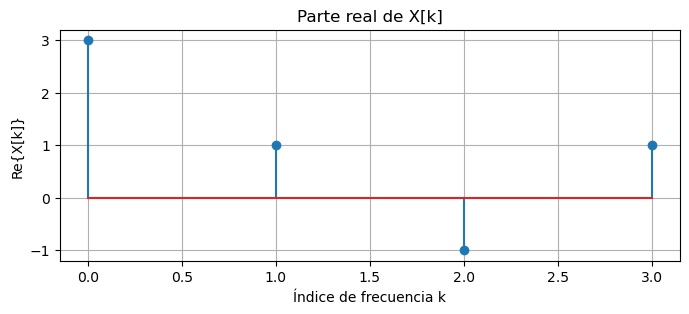

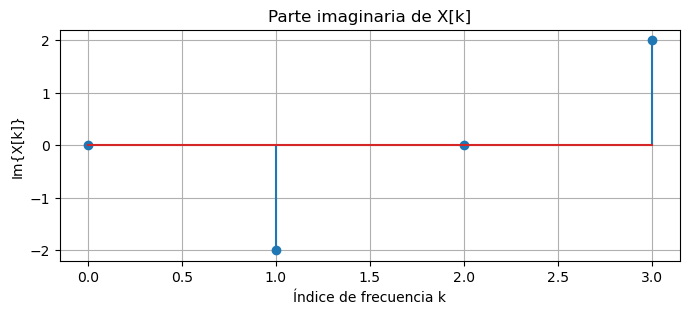

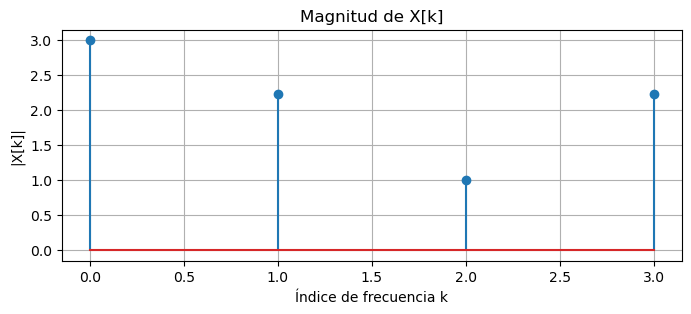

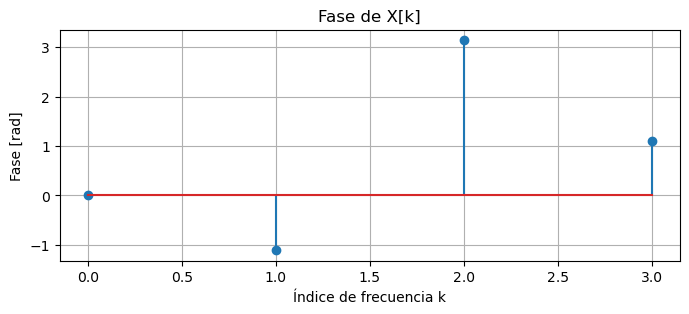

In [46]:
import numpy as np
import matplotlib.pyplot as plt
k = np.arange(len(X))

plt.figure(figsize=(8, 3))
plt.stem(k, np.real(X))
plt.title("Parte real de X[k]")
plt.xlabel("Índice de frecuencia k")
plt.ylabel("Re{X[k]}")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 3))
plt.stem(k, np.imag(X))
plt.title("Parte imaginaria de X[k]")
plt.xlabel("Índice de frecuencia k")
plt.ylabel("Im{X[k]}")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 3))
plt.stem(k, np.abs(X))
plt.title("Magnitud de X[k]")
plt.xlabel("Índice de frecuencia k")
plt.ylabel("|X[k]|")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 3))
plt.stem(k, np.angle(X))
plt.title("Fase de X[k]")
plt.xlabel("Índice de frecuencia k")
plt.ylabel("Fase [rad]")
plt.grid(True)
plt.show()

## 3.2. Transformada inversa: recuperación de la señal

Ahora verificaremos que es posible regresar desde el dominio de la frecuencia al dominio del tiempo.

La IDFT se define como:

$
x[n]=\frac{1}{N}\sum_{k=0}^{N-1}X[k]e^{j2\pi kn/N}
$

Si usamos el espectro complejo completo:

$
X[k]=[3,\;1-2j,\;-1,\;1+2j]
$

deberíamos recuperar:

$
x[n]=[1,\;2,\;0,\;0]
$

In [47]:
# Verificación de la transformada inversa

x_recuperada = np.fft.ifft(X)

print("Secuencia original:")
print(x)

print("\nSecuencia recuperada con IFFT:")
print(x_recuperada)

print("\nParte real de la secuencia recuperada:")
print(np.real(x_recuperada))

print("\n¿La señal recuperada coincide con la original?")
print(np.allclose(x, np.real(x_recuperada)))

Secuencia original:
[1 2 0 0]

Secuencia recuperada con IFFT:
[1.+0.j 2.+0.j 0.+0.j 0.+0.j]

Parte real de la secuencia recuperada:
[1. 2. 0. 0.]

¿La señal recuperada coincide con la original?
True


### Comentario importante

La pequeña parte imaginaria que puede aparecer al aplicar la IFFT se debe a errores numéricos de precisión computacional.

Matemáticamente, al aplicar la transformada inversa al espectro complejo completo, se recupera exactamente la señal original.

Esto refuerza una idea clave:

> Para reconstruir correctamente una señal no basta con conocer la magnitud del espectro. También se necesita la fase.

## 4. Teorema de la convolución

Una propiedad fundamental de la Transformada de Fourier es que la convolución en el tiempo equivale a una multiplicación en frecuencia.

Si:

$
y[n] = x[n] * h[n]
$

entonces:

$
Y[k] = X[k]H[k]
$

donde:

- $X[k]$ es la Transformada Discreta de Fourier de la señal de entrada $x[n]$,
- $H[k]$ es la Transformada Discreta de Fourier de la respuesta al impulso $h[n]$,
- $Y[k]$ es la Transformada Discreta de Fourier de la señal de salida $y[n]$.

Es importante notar que $X[k]$, $H[k]$ y $Y[k]$ son, en general, cantidades complejas. Por lo tanto, contienen información de magnitud y fase.

La magnitud indica cuánto contenido existe en cada frecuencia, mientras que la fase indica el desfase temporal asociado a cada componente frecuencial.

Por esta razón, el teorema de la convolución se aplica sobre los espectros complejos completos, no solo sobre sus magnitudes.

In [48]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
import librosa
from scipy.signal import fftconvolve
from IPython.display import Audio, display

## 5. Estructura de archivos esperada

Este notebook espera que los audios estén organizados así:

```text
assets/audio/
├── impulse_responses/
│   ├── IRBasilicaMono48.wav
│   ├── IRCompaniaMono48.wav
│   └── IRSanFranciscoMono48.wav
│
├── voz/
│   └── voz.wav
│
└── queen/
    ├── voice.wav
    ├── bass.wav
    ├── drums.wav
    ├── piano.wav
    ├── queen_mix.wav
    ├── queen_mix_aligned.wav
    └── mercury.wav
```

Primero trabajaremos con `voz.wav` y las respuestas al impulso.

In [49]:
ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()

AUDIO_DIR = ROOT / "assets" / "audio"
IR_DIR = AUDIO_DIR / "impulse_responses"
VOZ_DIR = AUDIO_DIR / "voz"
QUEEN_DIR = AUDIO_DIR / "queen"

print("ROOT:", ROOT)
print("AUDIO_DIR:", AUDIO_DIR)

assert AUDIO_DIR.exists(), f"No existe la carpeta: {AUDIO_DIR}"
assert IR_DIR.exists(), f"No existe la carpeta: {IR_DIR}"
assert VOZ_DIR.exists(), f"No existe la carpeta: {VOZ_DIR}"

ROOT: /Users/vpoblete/Documents/20230208_vpoblete/20260505_acus099_convolucion_teorema_fourier/acus099_convolucion_teorema_fourier
AUDIO_DIR: /Users/vpoblete/Documents/20230208_vpoblete/20260505_acus099_convolucion_teorema_fourier/acus099_convolucion_teorema_fourier/assets/audio


In [50]:
print("Respuestas al impulso disponibles:")
for archivo in sorted(IR_DIR.glob("*.wav")):
    print(" -", archivo.name)

print("\nAudios de voz disponibles:")
for archivo in sorted(VOZ_DIR.glob("*.wav")):
    print(" -", archivo.name)

if QUEEN_DIR.exists():
    print("\nPistas musicales disponibles:")
    for archivo in sorted(QUEEN_DIR.glob("*.wav")):
        print(" -", archivo.name)

Respuestas al impulso disponibles:
 - IRBasilicaMono48.wav
 - IRCompaniaMono48.wav
 - IRSanFranciscoMono48.wav

Audios de voz disponibles:
 - voz.wav

Pistas musicales disponibles:
 - bass.wav
 - drums.wav
 - mercury.wav
 - piano.wav
 - voice.wav


## 6. Funciones auxiliares

Definiremos funciones para:

- cargar audio en mono,
- remuestrear si es necesario,
- normalizar amplitud,
- graficar forma de onda,
- calcular espectros.

In [51]:
def cargar_audio_mono(ruta, sr_objetivo=None):
    """
    Carga un archivo de audio y lo convierte a mono.
    Si sr_objetivo no es None, remuestrea el audio.
    """
    y, sr = sf.read(ruta)

    if y.ndim > 1:
        y = y.mean(axis=1)

    y = y.astype(float)

    if sr_objetivo is not None and sr != sr_objetivo:
        y = librosa.resample(y, orig_sr=sr, target_sr=sr_objetivo)
        sr = sr_objetivo

    return y, sr


def normalizar_audio(y):
    """Normaliza una señal para que su valor máximo absoluto sea 1."""
    max_val = np.max(np.abs(y))
    if max_val > 0:
        return y / max_val
    return y


def plot_waveform(y, fs, title):
    """Grafica una señal en el dominio del tiempo."""
    t = np.arange(len(y)) / fs

    plt.figure(figsize=(10, 3))
    plt.plot(t, y)
    plt.title(title)
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def calcular_espectro_db(y, fs, n_fft=None):
    """
    Calcula el espectro de magnitud en dB usando rFFT.
    """
    if n_fft is None:
        n_fft = len(y)

    Y = np.fft.rfft(y, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/fs)

    mag = np.abs(Y)
    mag_db = 20 * np.log10(mag + 1e-12)

    return f, mag_db, Y

## 7. Cargar voz y respuestas al impulso

Cargaremos una misma voz y tres respuestas al impulso.

Luego escucharemos la voz original y observaremos las respuestas al impulso en el tiempo.

In [52]:
ruta_voz = VOZ_DIR / "voz.wav"

voz, fs = cargar_audio_mono(ruta_voz)
voz = normalizar_audio(voz)

print("Archivo de voz:", ruta_voz.name)
print("Frecuencia de muestreo:", fs, "Hz")
print(f"Duración voz: {len(voz)/fs:.2f} s")

Archivo de voz: voz.wav
Frecuencia de muestreo: 44100 Hz
Duración voz: 5.00 s


In [53]:
print("Voz original:")
display(Audio(voz, rate=fs))

Voz original:


In [54]:
ir_files = {
    "Basilica": IR_DIR / "IRBasilicaMono48.wav",
    "Compania": IR_DIR / "IRCompaniaMono48.wav",
    "SanFrancisco": IR_DIR / "IRSanFranciscoMono48.wav",
}

irs = {}

for nombre, ruta in ir_files.items():
    h, sr_h = cargar_audio_mono(ruta, sr_objetivo=fs)
    h = normalizar_audio(h)
    irs[nombre] = h

    print(f"{nombre}: {ruta.name} | duración = {len(h)/fs:.2f} s | fs = {fs} Hz")

Basilica: IRBasilicaMono48.wav | duración = 3.50 s | fs = 44100 Hz
Compania: IRCompaniaMono48.wav | duración = 2.00 s | fs = 44100 Hz
SanFrancisco: IRSanFranciscoMono48.wav | duración = 1.50 s | fs = 44100 Hz


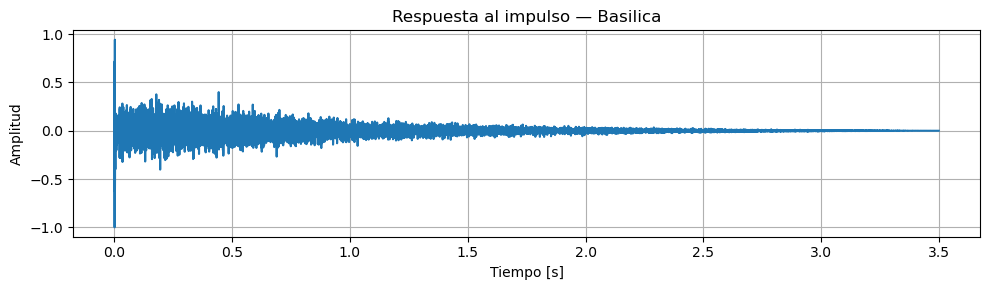

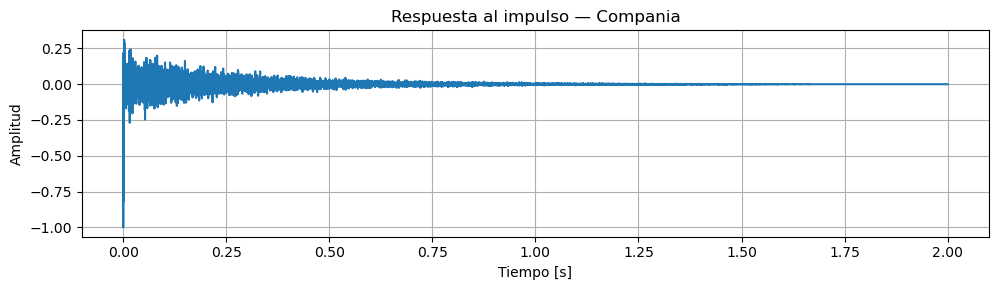

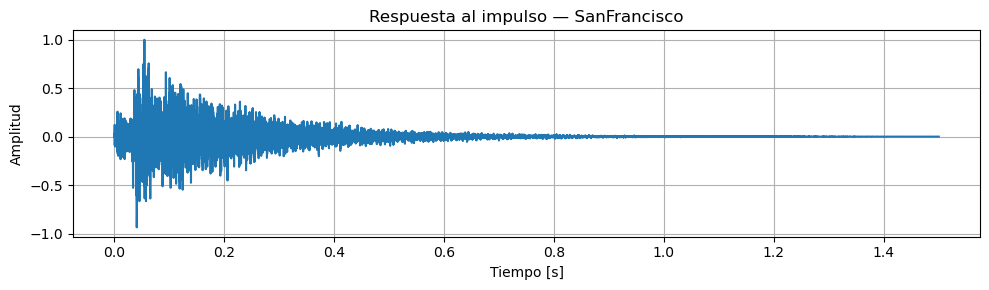

In [55]:
for nombre, h in irs.items():
    plot_waveform(h, fs, f"Respuesta al impulso — {nombre}")

## 8. Convolución de la voz con cada respuesta al impulso

Ahora usaremos:

$
y[n] = x[n] * h[n]
$

para simular cómo sonaría la voz al pasar por cada sala.

In [56]:
salidas = {}

for nombre, h in irs.items():
    y = fftconvolve(voz, h, mode="full")
    y = normalizar_audio(y)
    salidas[nombre] = y

    print(f"Salida {nombre}: duración = {len(y)/fs:.2f} s")

Salida Basilica: duración = 8.50 s
Salida Compania: duración = 7.00 s
Salida SanFrancisco: duración = 6.50 s


In [57]:
print("Voz original")
display(Audio(voz, rate=fs))

for nombre, y in salidas.items():
    print(f"Voz convolucionada — {nombre}")
    display(Audio(y, rate=fs))

Voz original


Voz convolucionada — Basilica


Voz convolucionada — Compania


Voz convolucionada — SanFrancisco


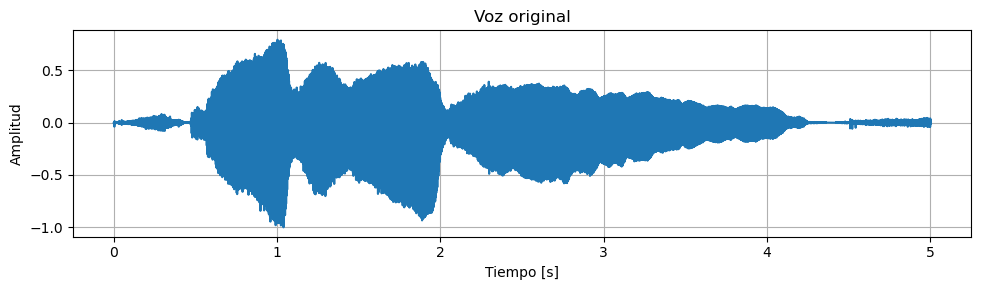

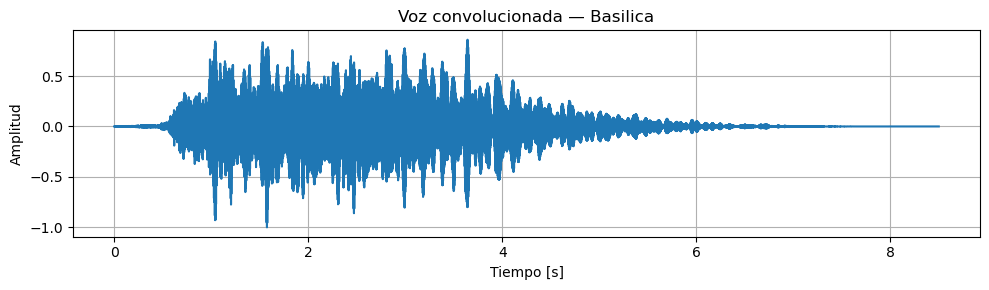

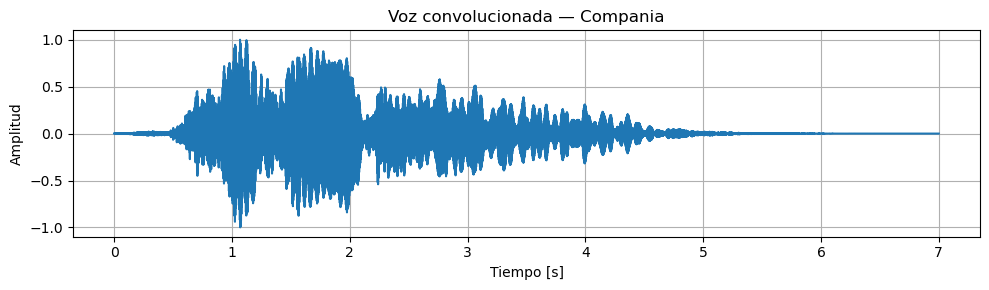

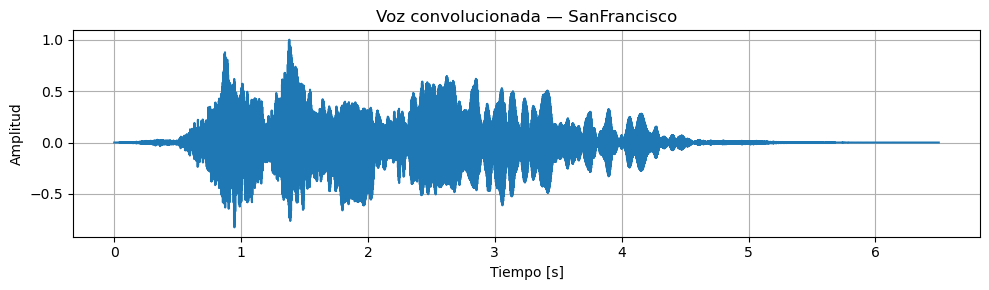

In [58]:
plot_waveform(voz, fs, "Voz original")

for nombre, y in salidas.items():
    plot_waveform(y, fs, f"Voz convolucionada — {nombre}")

## 9. De la respuesta al impulso a la respuesta en frecuencia

La respuesta al impulso $h[n]$ describe el comportamiento de una sala en el tiempo.

Su Transformada de Fourier:

$
H[k] = \mathcal{F}\{h[n]\}
$

describe cómo la sala modifica las frecuencias.

Esto se conoce como **respuesta en frecuencia**.

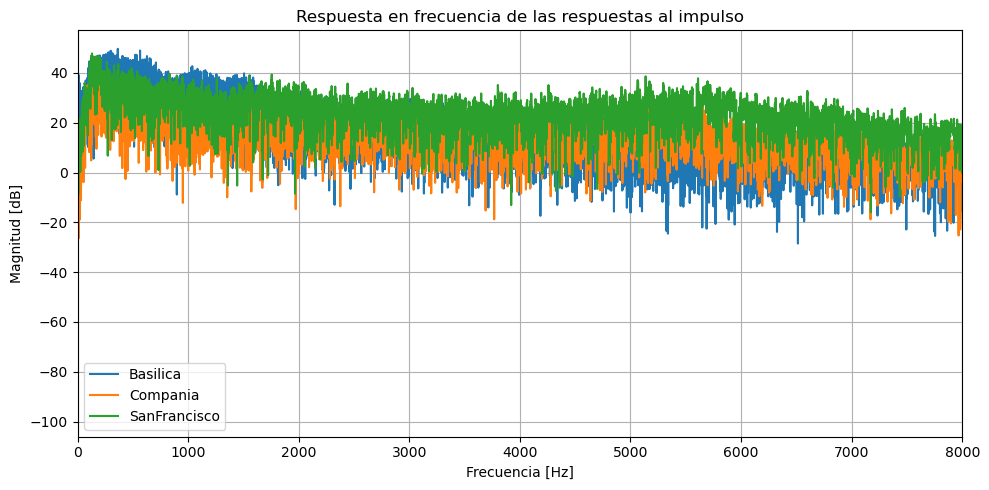

In [59]:
plt.figure(figsize=(10, 5))

for nombre, h in irs.items():
    f_h, H_db, _ = calcular_espectro_db(h, fs)
    plt.plot(f_h, H_db, label=nombre)

plt.title("Respuesta en frecuencia de las respuestas al impulso")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Magnitud [dB]")
plt.xlim(0, 8000)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## 10. Espectro de la voz original

Antes de observar las salidas, veamos el espectro de la señal de entrada.

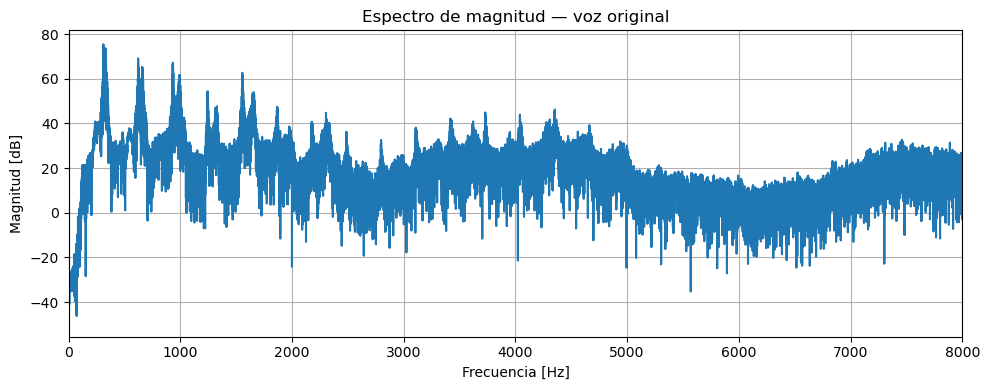

In [60]:
f_voz, mag_voz, _ = calcular_espectro_db(voz, fs)

plt.figure(figsize=(10, 4))
plt.plot(f_voz, mag_voz)
plt.title("Espectro de magnitud — voz original")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Magnitud [dB]")
plt.xlim(0, 8000)
plt.grid(True)
plt.tight_layout()
plt.show()

## 11. Comparación espectral: entrada y salidas

Ahora comparamos el espectro de la voz original con las señales convolucionadas.

Si la sala actúa como un sistema, entonces su respuesta en frecuencia modifica el espectro de la voz.

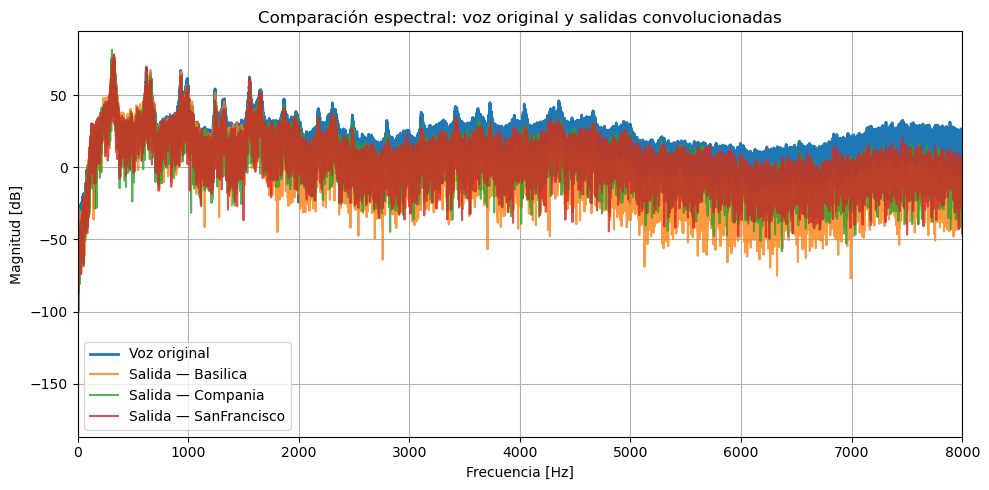

In [61]:
plt.figure(figsize=(10, 5))

plt.plot(f_voz, mag_voz, label="Voz original", linewidth=2)

for nombre, y in salidas.items():
    f_y, mag_y, _ = calcular_espectro_db(y, fs)
    plt.plot(f_y, mag_y, label=f"Salida — {nombre}", alpha=0.8)

plt.title("Comparación espectral: voz original y salidas convolucionadas")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Magnitud [dB]")
plt.xlim(0, 8000)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## 12. Verificación del teorema de la convolución

Vamos a demostrar numéricamente que:

$
y[n] = x[n] * h[n]
$

es equivalente a:

$
Y[k] = X[k]H[k]
$

El procedimiento será:

1. Convolucionar en el tiempo.
2. Calcular $X[k]$ y $H[k]$.
3. Multiplicar $X[k]H[k]$.
4. Volver al tiempo con la IFFT.
5. Comparar ambas señales.

In [62]:
nombre_ir = "SanFrancisco"
h = irs[nombre_ir]

# Convolución en el tiempo
y_time = fftconvolve(voz, h, mode="full")

# Longitud correcta para convolución lineal usando FFT
N = len(voz) + len(h) - 1

# FFT de entrada y sistema
X = np.fft.rfft(voz, n=N)
H = np.fft.rfft(h, n=N)

# Multiplicación en frecuencia
Y = X * H

# Volver al tiempo
y_freq_to_time = np.fft.irfft(Y, n=N)

# Comparar
error = np.max(np.abs(y_time - y_freq_to_time))

print(f"Respuesta al impulso usada: {nombre_ir}")
print(f"Error máximo entre ambos métodos: {error:.2e}")

Respuesta al impulso usada: SanFrancisco
Error máximo entre ambos métodos: 6.39e-14


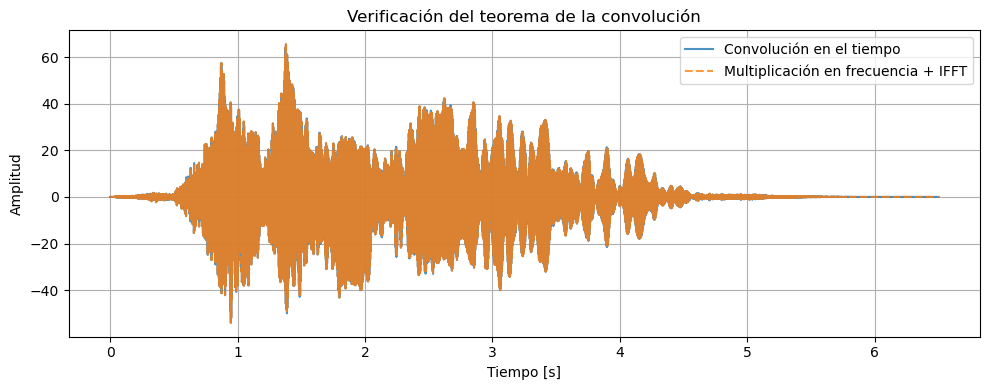

In [63]:
t_y = np.arange(len(y_time)) / fs

plt.figure(figsize=(10, 4))
plt.plot(t_y, y_time, label="Convolución en el tiempo", alpha=0.8)
plt.plot(t_y, y_freq_to_time, "--", label="Multiplicación en frecuencia + IFFT", alpha=0.8)
plt.title("Verificación del teorema de la convolución")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## 13. Visualizar el error

Como las señales son prácticamente iguales, también podemos graficar la diferencia entre ambas.

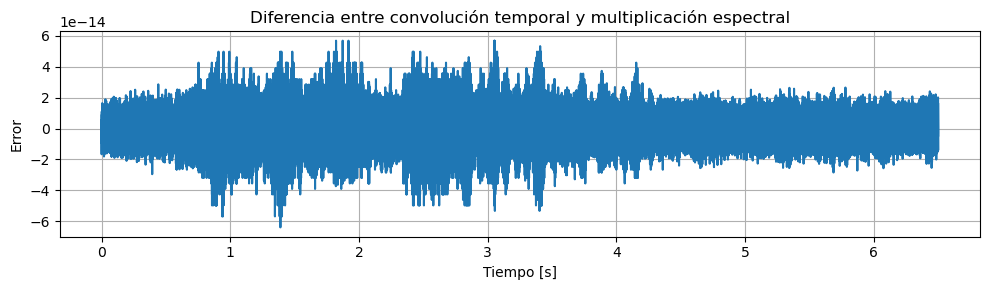

In [64]:
diferencia = y_time - y_freq_to_time

plt.figure(figsize=(10, 3))
plt.plot(t_y, diferencia)
plt.title("Diferencia entre convolución temporal y multiplicación espectral")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error")
plt.grid(True)
plt.tight_layout()
plt.show()

## 14. Extensión: usar pistas musicales

Como extensión, podemos repetir el análisis usando pistas musicales.

Por ejemplo:

- voz,
- bajo,
- batería,
- piano,
- mezcla.

Esto permite analizar cómo una misma sala afecta de manera diferente a distintos instrumentos o fuentes sonoras.

In [65]:
if QUEEN_DIR.exists():
    queen_files = sorted(QUEEN_DIR.glob("*.wav"))
    for archivo in queen_files:
        print("-", archivo.name)
else:
    print("No se encontró carpeta queen.")

- bass.wav
- drums.wav
- mercury.wav
- piano.wav
- voice.wav


In [66]:
ruta_musica = QUEEN_DIR / "piano.wav"

if ruta_musica.exists():
    musica, fs_musica = cargar_audio_mono(ruta_musica, sr_objetivo=fs)
    musica = normalizar_audio(musica)

    h = irs["Basilica"]
    musica_sala = fftconvolve(musica, h, mode="full")
    musica_sala = normalizar_audio(musica_sala)

    print("Música original")
    display(Audio(musica, rate=fs))

    print("Música convolucionada con Basilica")
    display(Audio(musica_sala, rate=fs))
else:
    print(f"No existe el archivo: {ruta_musica.name}")

Música original


Música convolucionada con Basilica


## 15. Preguntas para discusión

1. ¿Qué diferencias se observan entre las respuestas al impulso?
2. ¿Cuál respuesta al impulso parece tener mayor duración temporal?
3. ¿Qué diferencias aparecen en las respuestas en frecuencia?
4. ¿Qué significa que una sala atenúe o amplifique ciertas frecuencias?
5. ¿Por qué la misma voz cambia al convolucionarse con distintas respuestas al impulso?
6. ¿Qué demuestra el error pequeño en la verificación del teorema de la convolución?
7. ¿Qué ventaja tiene estudiar la sala en el dominio de la frecuencia?
8. ¿Por qué la Transformada de Fourier permite reinterpretar una operación temporal como una operación espectral?

## 16. Cierre

En esta clase conectamos la convolución con la Transformada de Fourier.

La respuesta al impulso describe un sistema en el dominio del tiempo:

$
h[n]
$

La respuesta en frecuencia describe el mismo sistema en el dominio de la frecuencia:

$
H[k]
$

La salida puede calcularse de dos formas equivalentes:

$
y[n] = x[n] * h[n]
$

o:

$
Y[k] = X[k]H[k]
$

Esta equivalencia es una de las ideas más importantes del procesamiento digital de señales.

La Transformada de Fourier no solo es una herramienta de cálculo: es una forma distinta de mirar una señal. Nos permite comprender cómo un sistema afecta el contenido frecuencial de una señal y, en este caso, cómo una sala modifica una voz o una señal musical.